In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
#!wget -O /kaggle/working/global-wheat.zip "https://zenodo.org/record/4298502/files/global-wheat-codalab-official.zip?download=1"



In [13]:
#import zipfile, os
#with zipfile.ZipFile("/kaggle/working/global-wheat.zip", 'r') as z:
 #   z.extractall("/kaggle/working/global-wheat_extracted")


In [2]:
import pandas as pd

df = pd.read_csv("/kaggle/input/global-wheat-detection/train.csv")

df.head()


,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [3]:
images_per_source = df.groupby("source")["image_id"].nunique().sort_values(ascending=False)
images_per_source


source
arvalis_1    1055
ethz_1        747
arvalis_3     559
rres_1        432
arvalis_2     204
usask_1       200
inrae_1       176
Name: image_id, dtype: int64

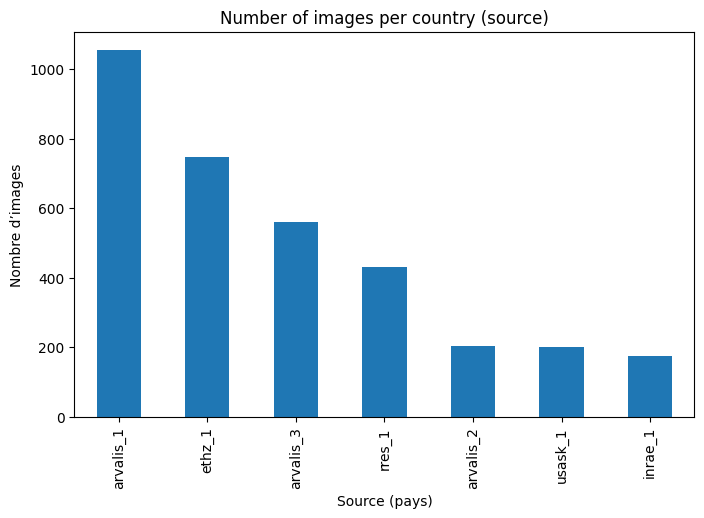

In [4]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
images_per_source.plot(kind="bar")
plt.title("Number of images per country (source)")
plt.xlabel("Source (pays)")
plt.ylabel("Nombre d’images")
plt.show()


In [5]:
bboxes_per_source = df.groupby("source")["bbox"].count().sort_values(ascending=False)
bboxes_per_source


source
ethz_1       51489
arvalis_1    45716
rres_1       20236
arvalis_3    16665
usask_1       5807
arvalis_2     4179
inrae_1       3701
Name: bbox, dtype: int64

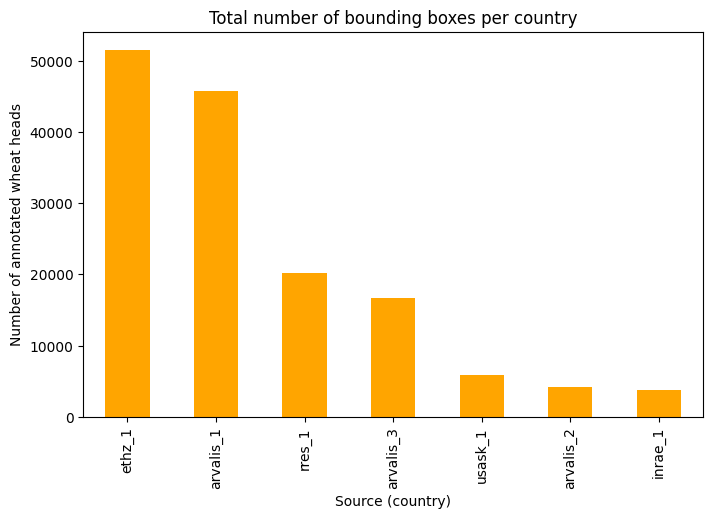

In [6]:
plt.figure(figsize=(8,5))
bboxes_per_source.plot(kind="bar", color="orange")
plt.title("Total number of bounding boxes per country")
plt.xlabel("Source (country)")
plt.ylabel("Number of annotated wheat heads")

plt.show()


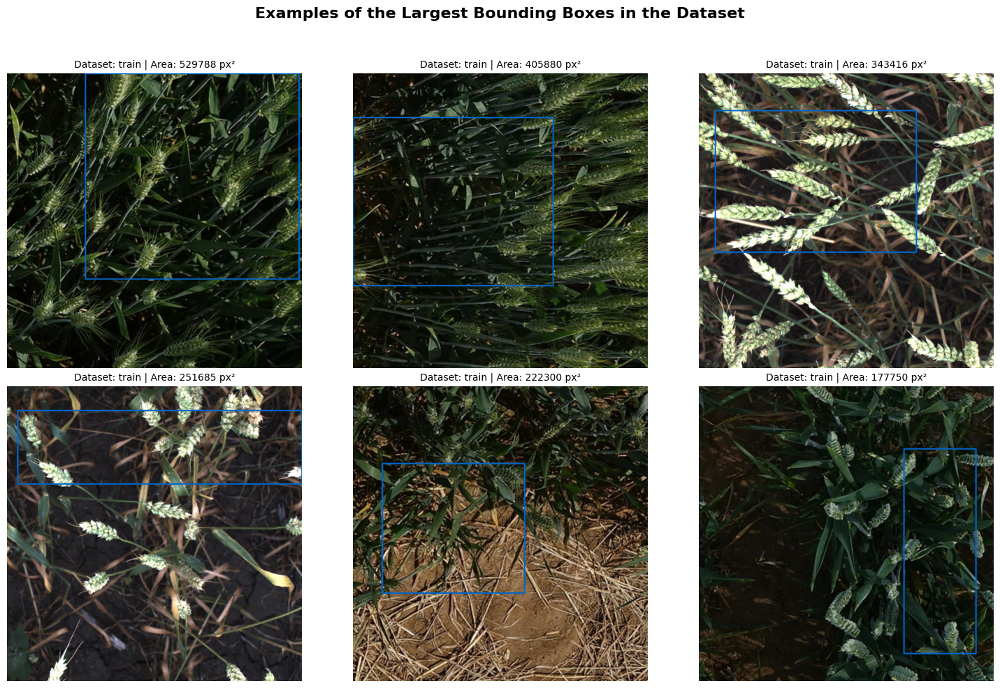

In [31]:
import pandas as pd
import ast
import cv2
import matplotlib.pyplot as plt

# Charger le CSV
df = pd.read_csv("/kaggle/input/global-wheat-detection/train.csv")

# Convertir bbox de string en liste si nécessaire
df['bbox'] = df['bbox'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

# Calculer l'aire de chaque bbox
df['area'] = df['bbox'].apply(lambda b: b[2] * b[3])

# Trier toutes les bbox par aire décroissante et prendre les 6 plus grandes
largest_boxes = df.sort_values(by='area', ascending=False).head(6)

plt.figure(figsize=(15, 10))

for i, (_, row) in enumerate(largest_boxes.iterrows()):
    img_path = f"/kaggle/input/global-wheat-detection/train/{row['image_id']}.jpg"  # adapte le chemin

    # Charger l'image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Could not load image {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Extraire bbox
    x, y, w, h = row['bbox']
    x2, y2 = x + w, y + h

    # Dessiner bbox
    cv2.rectangle(img, (int(x), int(y)), (int(x2), int(y2)), (0, 102, 204), 3)

    # Affichage
    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(f"Dataset: train | Area: {row['area']:.0f} px²", fontsize=10)
    plt.axis('off')

plt.suptitle("Examples of the Largest Bounding Boxes in the Dataset", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


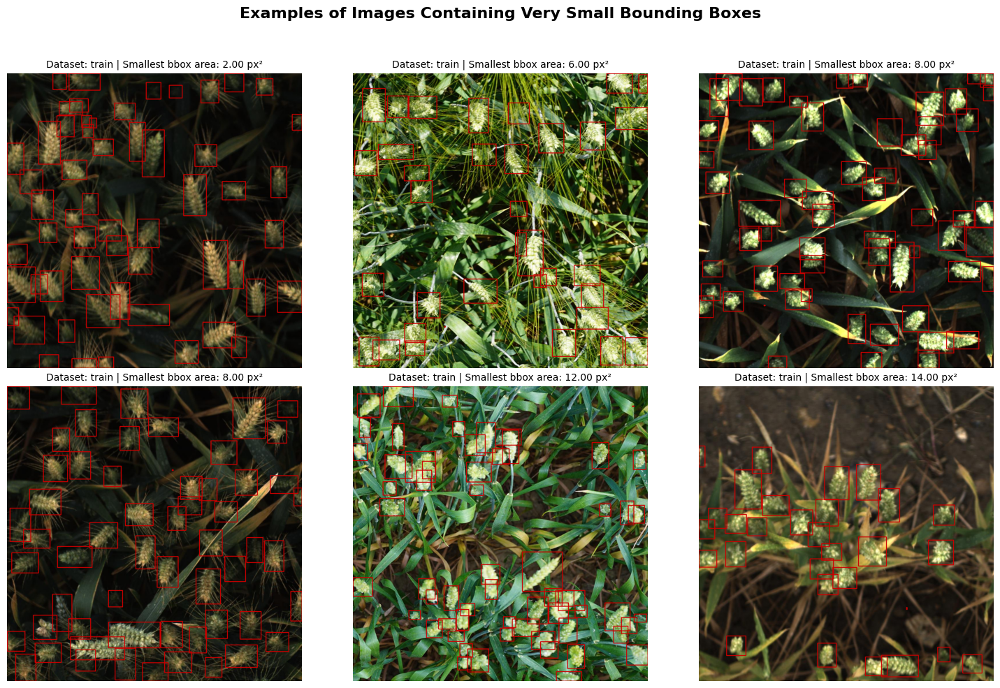

In [33]:
import pandas as pd
import ast
import cv2
import matplotlib.pyplot as plt

# Charger le CSV
df = pd.read_csv("/kaggle/input/global-wheat-detection/train.csv")

# Convertir bbox de string en liste si nécessaire
df['bbox'] = df['bbox'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

# Calculer l'aire de chaque bbox
df['area'] = df['bbox'].apply(lambda b: b[2] * b[3])

# Filtrer les bbox très petites, par exemple aire < 50 px²
small_bboxes = df[(df['area'] > 0) & (df['area'] < 50)]

# Trier pour prendre les 6 plus petites bbox
small_bboxes = small_bboxes.sort_values(by='area', ascending=True).head(6)

plt.figure(figsize=(15, 10))

for i, (_, row) in enumerate(small_bboxes.iterrows()):
    img_path = f"/kaggle/input/global-wheat-detection/train/{row['image_id']}.jpg"  # adapte le chemin

    # Charger l'image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Warning: Could not load image {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Récupérer toutes les bbox de cette image
    img_bboxes = df[df['image_id'] == row['image_id']]

    for _, b_row in img_bboxes.iterrows():
        x, y, w, h = b_row['bbox']
        x2, y2 = x + w, y + h
        # Dessiner bbox
        cv2.rectangle(img, (int(x), int(y)), (int(x2), int(y2)), (204, 0, 0), 2)  # rouge

    # Affichage
    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(f"Dataset: train | Smallest bbox area: {row['area']:.2f} px²", fontsize=10)
    plt.axis('off')

plt.suptitle("Examples of Images Containing Very Small Bounding Boxes", fontsize=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


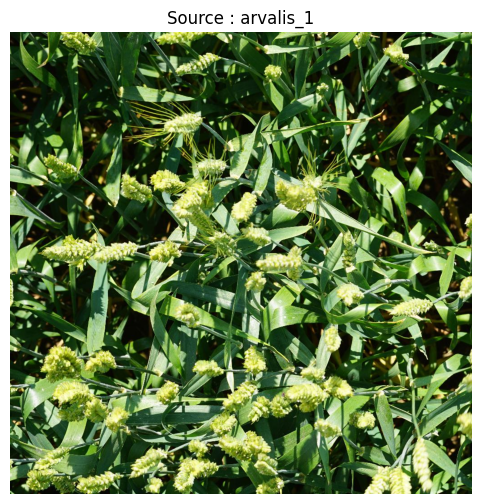

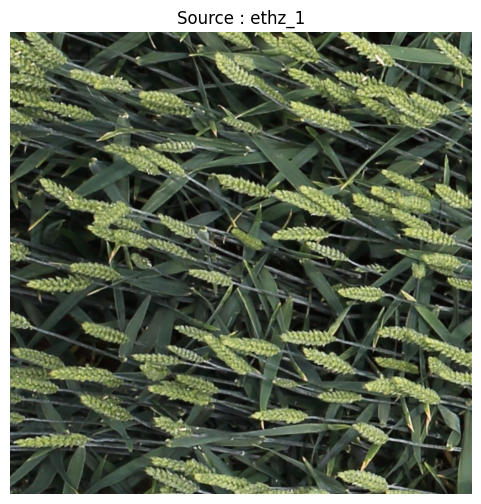

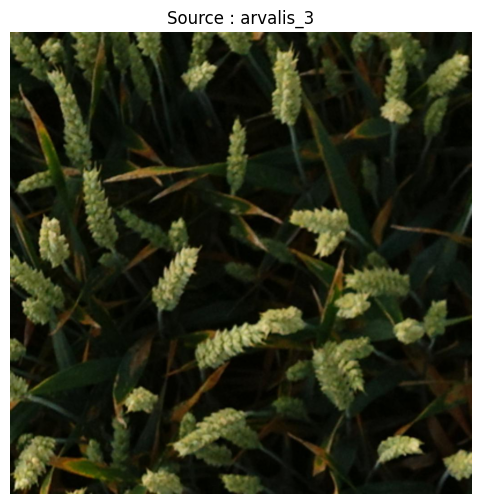

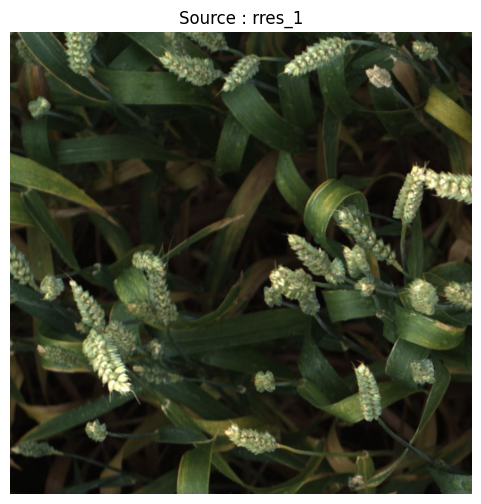

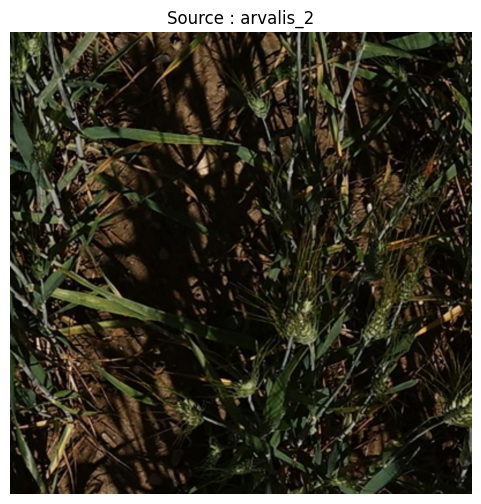

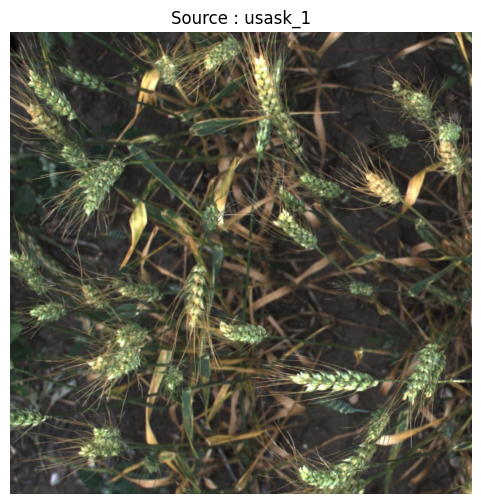

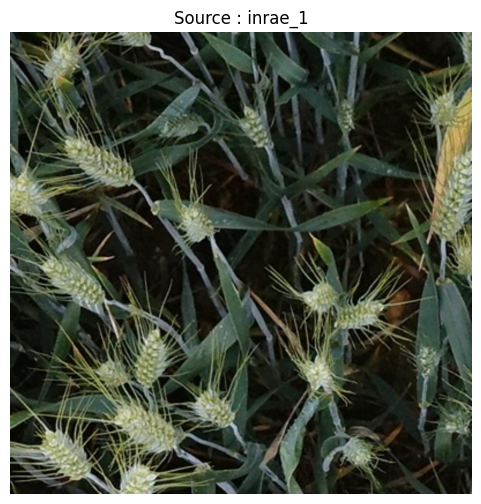

In [6]:
import os
import cv2
import matplotlib.pyplot as plt

train_path = "/kaggle/input/global-wheat-detection/train/"

for src in images_per_source.index:
    img_id = df[df["source"] == src]["image_id"].iloc[0]
    img_path = train_path + img_id + ".jpg"
    
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.title(f"Source : {src}")
    plt.axis("off")
    plt.show()


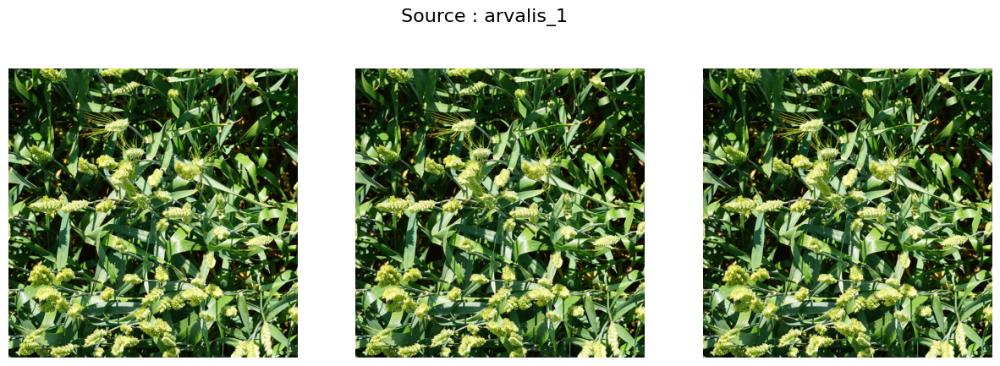

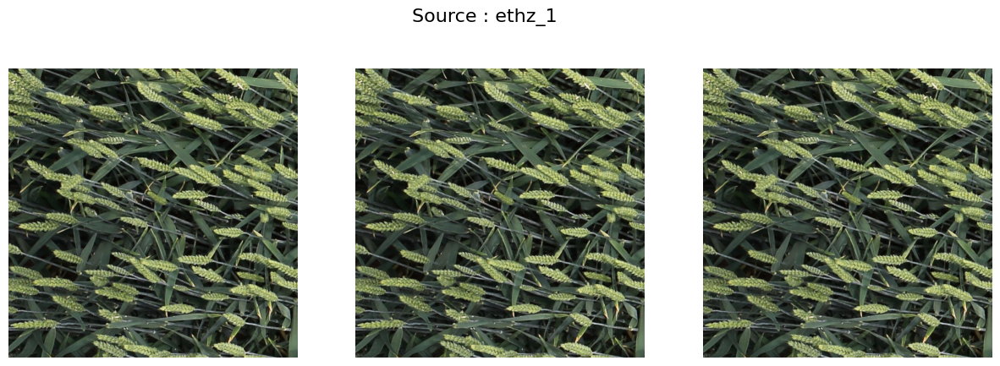

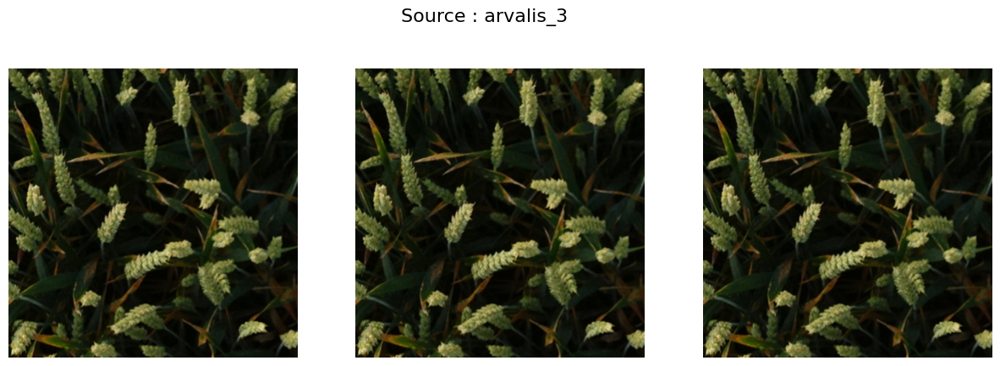

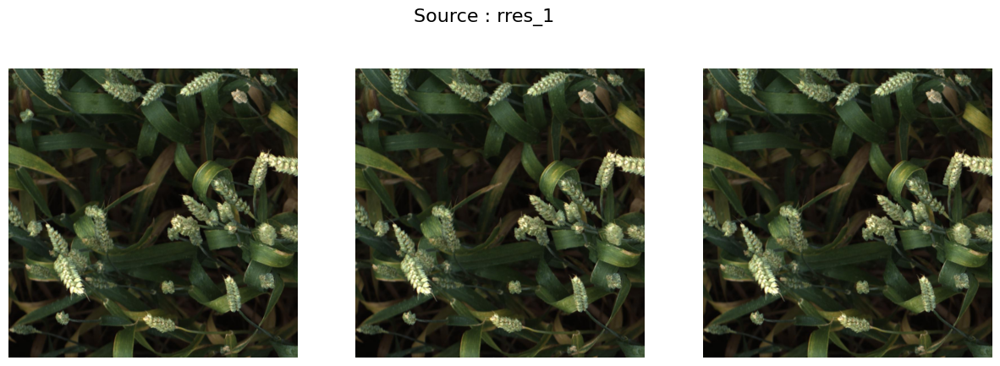

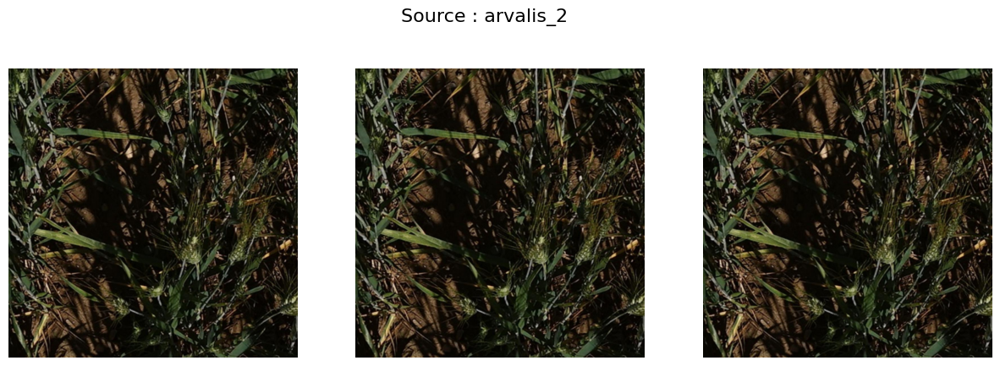

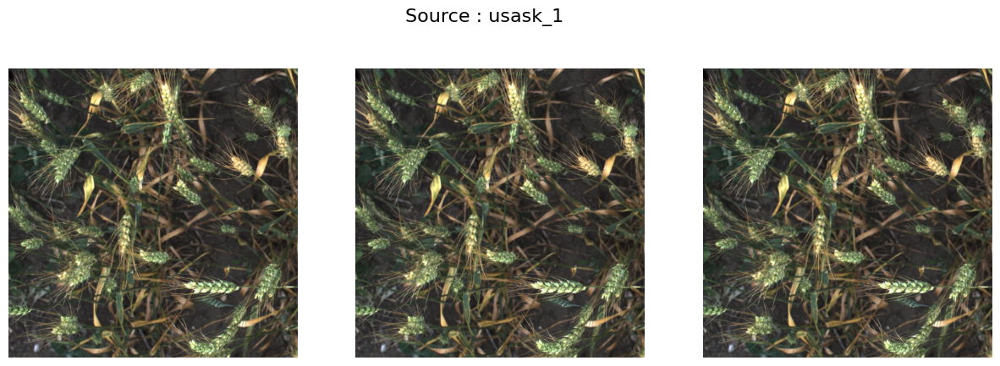

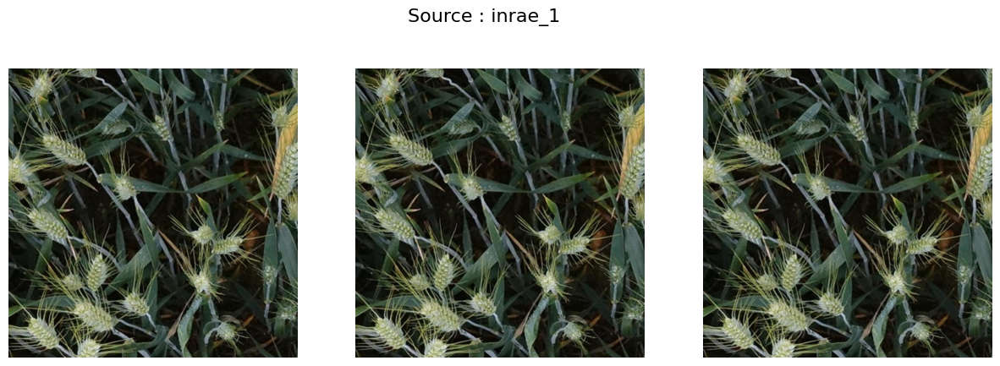

In [7]:
import cv2
import matplotlib.pyplot as plt

train_path = "/kaggle/input/global-wheat-detection/train/"

for src in images_per_source.index:

    # Récupérer les 3 premières images de chaque classe
    img_ids = df[df["source"] == src]["image_id"].iloc[:3]

    # Créer une ligne de 3 images
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"Source : {src}", fontsize=16)

    for ax, img_id in zip(axes, img_ids):
        img_path = train_path + img_id + ".jpg"

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        ax.imshow(img)
        ax.axis("off")

    plt.show()


In [8]:
# Sélectionner une image au hasard
image_id = df.sample(1)['image_id'].values[0]
print("Image sélectionnée :", image_id)

# Lire l'image
image_path = f"/kaggle/input/global-wheat-detection/train/{image_id}.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Filtrer les annotations de cette image
boxes = df[df['image_id'] == image_id]


Image sélectionnée : b5487f037


In [9]:
import ast  # pour convertir string en liste

# Convertir la colonne bbox de string en liste
df['bbox'] = df['bbox'].apply(ast.literal_eval)

# Créer des colonnes séparées : xmin, ymin, largeur, hauteur
df['xmin'] = df['bbox'].apply(lambda x: x[0])
df['ymin'] = df['bbox'].apply(lambda x: x[1])
df['w'] = df['bbox'].apply(lambda x: x[2])
df['h'] = df['bbox'].apply(lambda x: x[3])


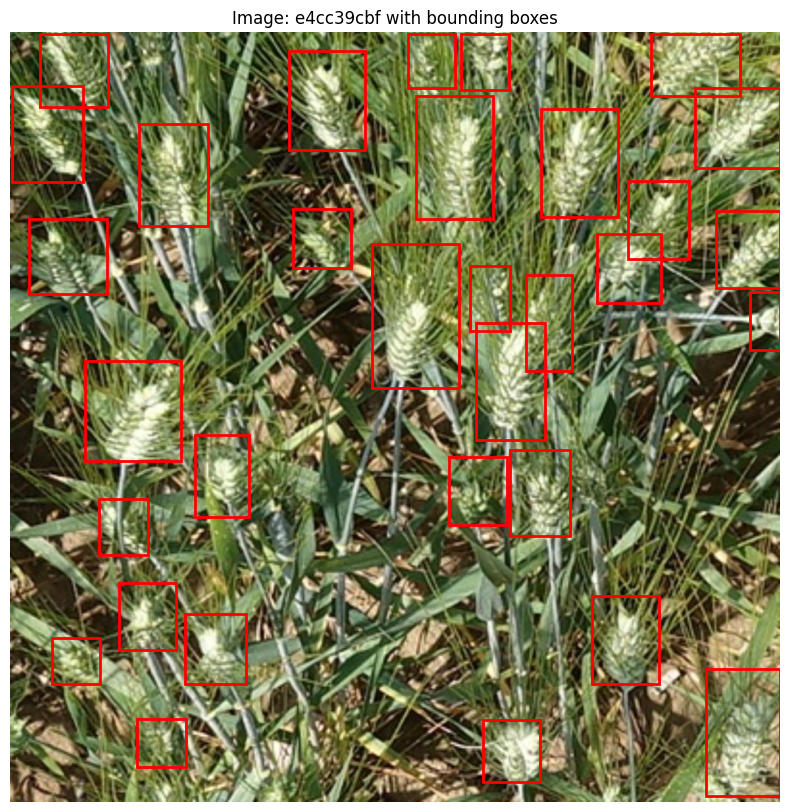

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import os

# Sélectionner une image au hasard
image_id = df.sample(1)['image_id'].values[0]

# Lire l'image
image_path = f"/kaggle/input/global-wheat-detection/train/{image_id}.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Filtrer les annotations de cette image
boxes = df[df['image_id'] == image_id]

# Afficher l'image avec les bounding boxes
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)

for _, row in boxes.iterrows():
    rect = patches.Rectangle((row['xmin'], row['ymin']), row['w'], row['h'],
                             linewidth=2, edgecolor='red', facecolor='none')
    ax.add_patch(rect)

plt.title(f"Image: {image_id} with bounding boxes")

plt.axis('off')
plt.show()


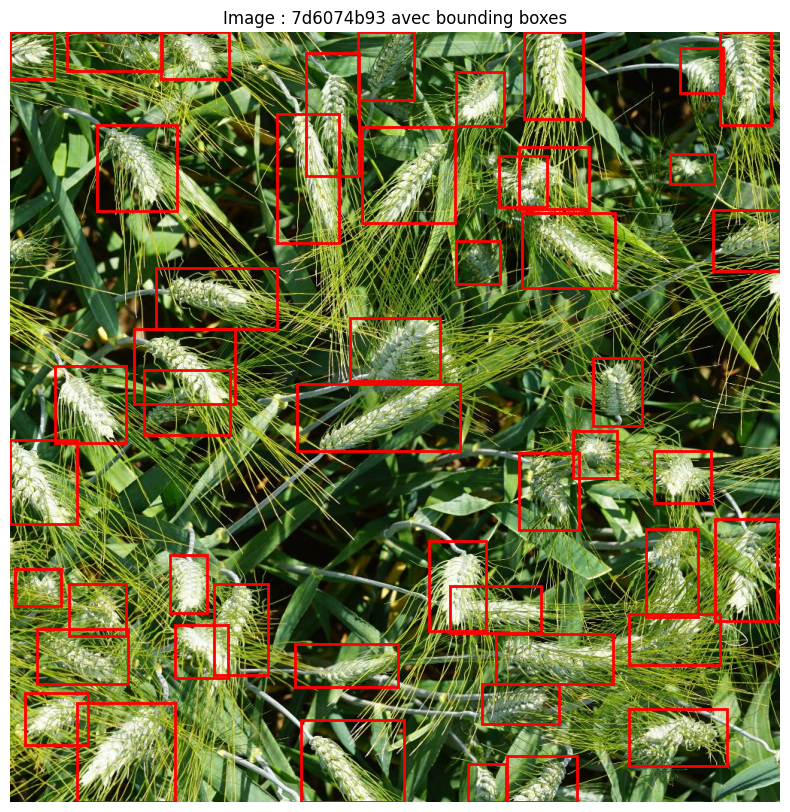

In [11]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import os

# Sélectionner une image au hasard
image_id = df.sample(1)['image_id'].values[0]

# Lire l'image
image_path = f"/kaggle/input/global-wheat-detection/train/{image_id}.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Filtrer les annotations de cette image
boxes = df[df['image_id'] == image_id]

# Afficher l'image avec les bounding boxes
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)

for _, row in boxes.iterrows():
    rect = patches.Rectangle((row['xmin'], row['ymin']), row['w'], row['h'],
                             linewidth=2, edgecolor='red', facecolor='none')
    ax.add_patch(rect)

plt.title(f"Image : {image_id} avec bounding boxes")
plt.axis('off')
plt.show()


# Préparer le CSV et la colonne bbox

In [18]:
import pandas as pd
import ast

df = pd.read_csv("/kaggle/input/global-wheat-detection/train.csv")

# Convertir bbox de string en liste
df['bbox'] = df['bbox'].apply(ast.literal_eval)

# Créer des colonnes séparées
df['xmin'] = df['bbox'].apply(lambda x: x[0])
df['ymin'] = df['bbox'].apply(lambda x: x[1])
df['w'] = df['bbox'].apply(lambda x: x[2])
df['h'] = df['bbox'].apply(lambda x: x[3])


# Préparer le dataset par pays

In [19]:
import tensorflow as tf
import cv2
import numpy as np
import os

train_path = "/kaggle/input/global-wheat-detection/train/"

def load_images_by_country(df, country, max_images=None):
    image_ids = df[df['source']==country]['image_id'].unique()
    if max_images:
        image_ids = image_ids[:max_images]
    
    images = []
    for img_id in image_ids:
        img_path = os.path.join(train_path, img_id + ".jpg")
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (224,224))  # Redimensionner pour le CNN
        img = img / 255.0  # Normaliser
        images.append(img)
    return np.array(images)


# Préparer le CNN pré-entraîné pour extraire les features

In [13]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

# CNN pré-entraîné sans la couche finale
base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg', input_shape=(224,224,3))


I0000 00:00:1764925121.203425      48 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


# Extraire les features des images

In [20]:
def extract_features_tf(images):
    images = preprocess_input(images)
    features = base_model.predict(images, batch_size=16, verbose=1)
    return features


# Calculer la MMD (RBF Kernel)

In [21]:
from sklearn.metrics import pairwise_kernels

def compute_mmd(X, Y, kernel='rbf', gamma=1.0):
    K_XX = pairwise_kernels(X, X, metric=kernel, gamma=gamma)
    K_YY = pairwise_kernels(Y, Y, metric=kernel, gamma=gamma)
    K_XY = pairwise_kernels(X, Y, metric=kernel, gamma=gamma)
    return K_XX.mean() + K_YY.mean() - 2*K_XY.mean()


# Calculer la MMD entre tous les pays

In [22]:
countries = df['source'].unique()
features_dict = {}

# Extraire features pour chaque pays (on peut limiter les images pour accélérer)
for country in countries:
    print("Loading images:", country)
    imgs = load_images_by_country(df, country, max_images=50)  # max_images=50 to speed up
    print("Extracting features:", country)
    feats = extract_features_tf(imgs)
    features_dict[country] = feats


# Calculer MMD
import numpy as np
mmd_matrix = np.zeros((len(countries), len(countries)))

for i, c1 in enumerate(countries):
    for j, c2 in enumerate(countries):
        mmd_matrix[i,j] = compute_mmd(features_dict[c1], features_dict[c2])

mmd_df = pd.DataFrame(mmd_matrix, index=countries, columns=countries)


Loading images: usask_1
Extracting features: usask_1
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
Loading images: arvalis_1
Extracting features: arvalis_1
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Loading images: inrae_1
Extracting features: inrae_1
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Loading images: ethz_1
Extracting features: ethz_1
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Loading images: arvalis_3
Extracting features: arvalis_3
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Loading images: rres_1
Extracting features: rres_1
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Loading images: arvalis_2
Extracting features: arvalis_2
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


# Visualiser le Domain Shift

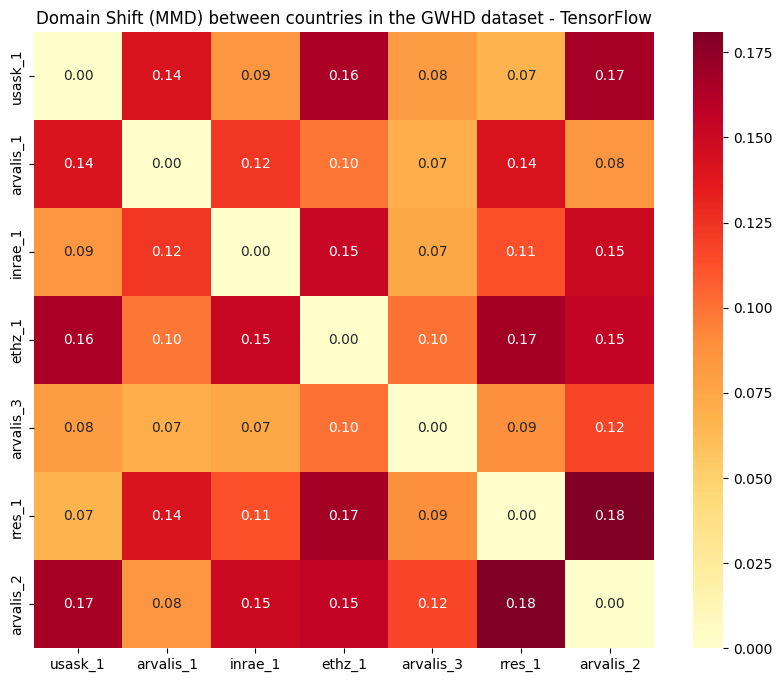

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
sns.heatmap(mmd_df, annot=True, fmt=".2f", cmap="YlOrRd")
plt.title("Domain Shift (MMD) between countries in the GWHD dataset - TensorFlow")

plt.show()


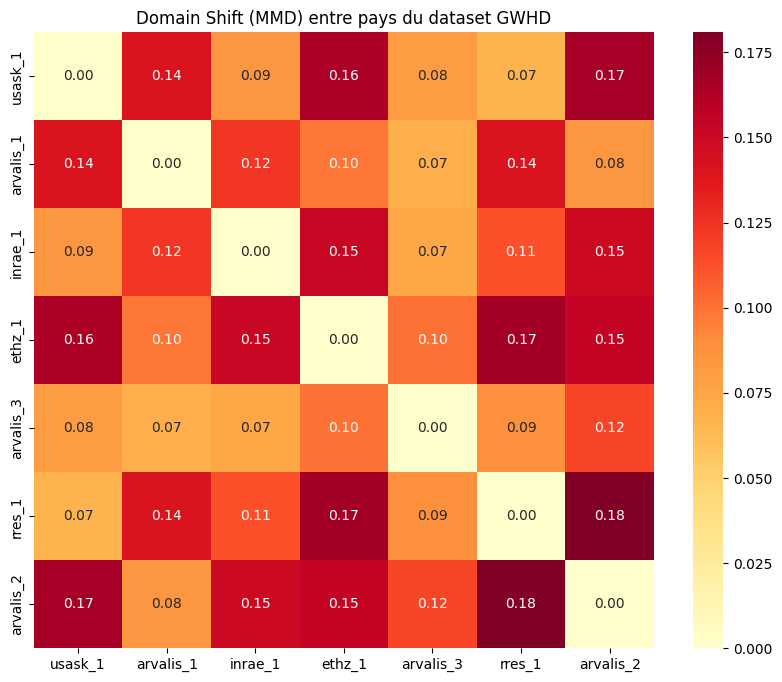

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,8))
sns.heatmap(mmd_df, annot=True, fmt=".2f", cmap="YlOrRd")
plt.title("Domain Shift (MMD) entre pays du dataset GWHD")
plt.show()


# PCA ou t-SNE pour visualiser les features par pays

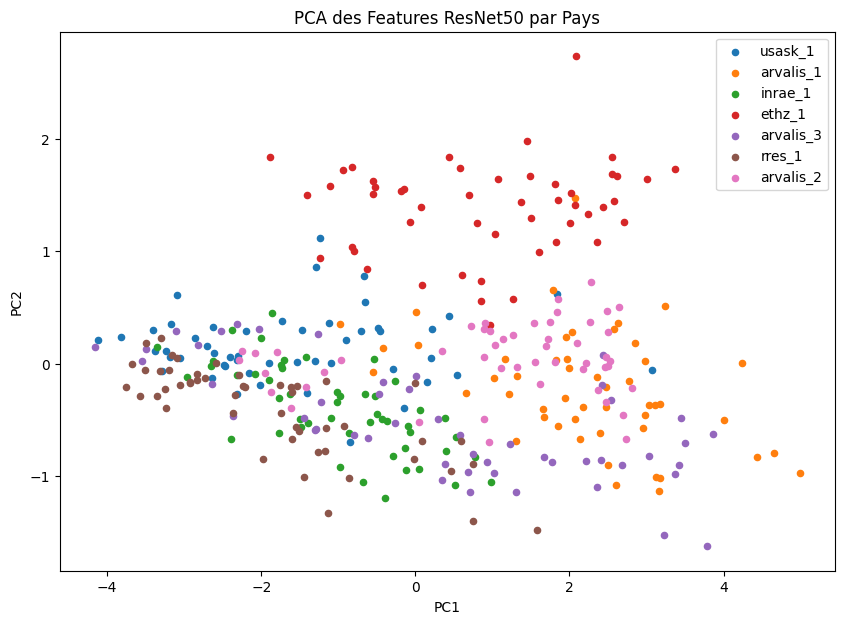

In [24]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Préparer X (features concaténés) et y (labels pays)
X = []
y = []

for country in features_dict:
    feats = features_dict[country]
    X.append(feats)
    y += [country] * len(feats)

X = np.vstack(X)

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Affichage
plt.figure(figsize=(10,7))
for country in features_dict:
    idx = [i for i, c in enumerate(y) if c == country]
    plt.scatter(X_pca[idx, 0], X_pca[idx, 1], s=20, label=country)

plt.legend()
plt.title("PCA des Features ResNet50 par Pays")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


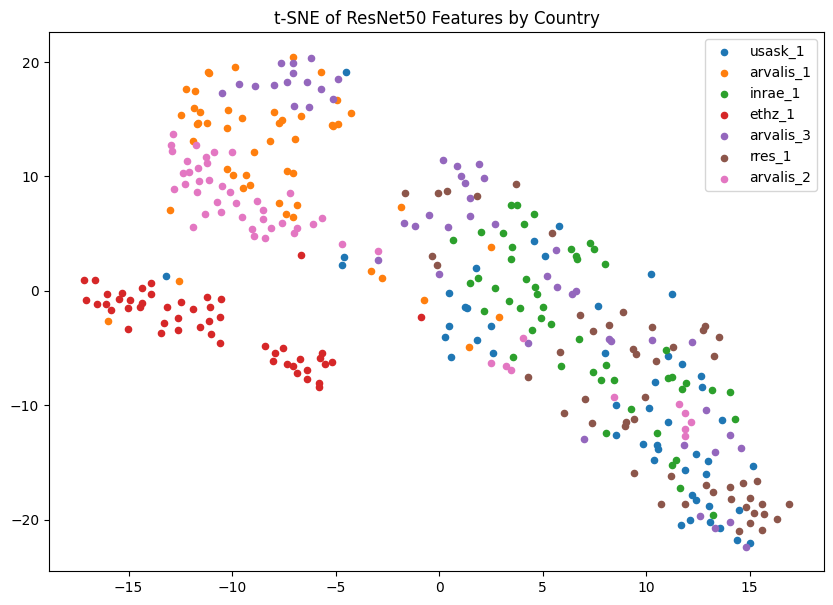

In [25]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(10,7))
for country in features_dict:
    idx = [i for i, c in enumerate(y) if c == country]
    plt.scatter(X_tsne[idx, 0], X_tsne[idx, 1], s=20, label=country)

plt.legend()
plt.title("t-SNE of ResNet50 Features by Country")

plt.show()


# Histogrammes de luminance / couleurs par pays

In [26]:
def compute_luminance(img):
    return np.mean(cv2.cvtColor((img*255).astype(np.uint8), cv2.COLOR_RGB2GRAY))

luminance_dict = {}

for country in countries:
    imgs = load_images_by_country(df, country, max_images=50)
    luminances = [compute_luminance(img) for img in imgs]
    luminance_dict[country] = luminances


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

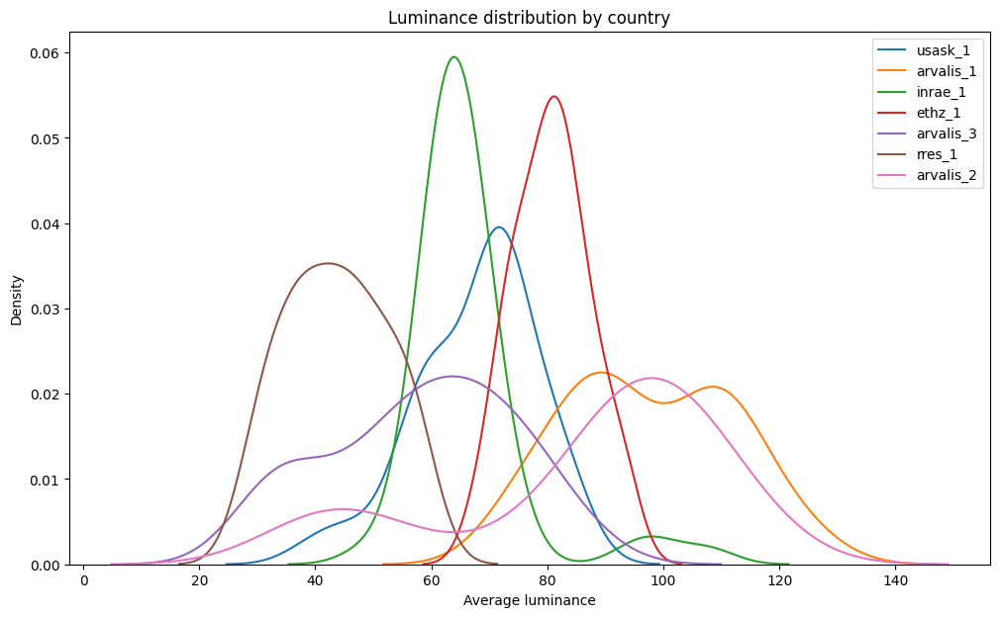

In [27]:
plt.figure(figsize=(12,7))
for country in luminance_dict:
    sns.kdeplot(luminance_dict[country], label=country)

plt.title("Luminance distribution by country")
plt.xlabel("Average luminance")
plt.ylabel("Density")
plt.legend()
plt.show()


# Histigramme RGB

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

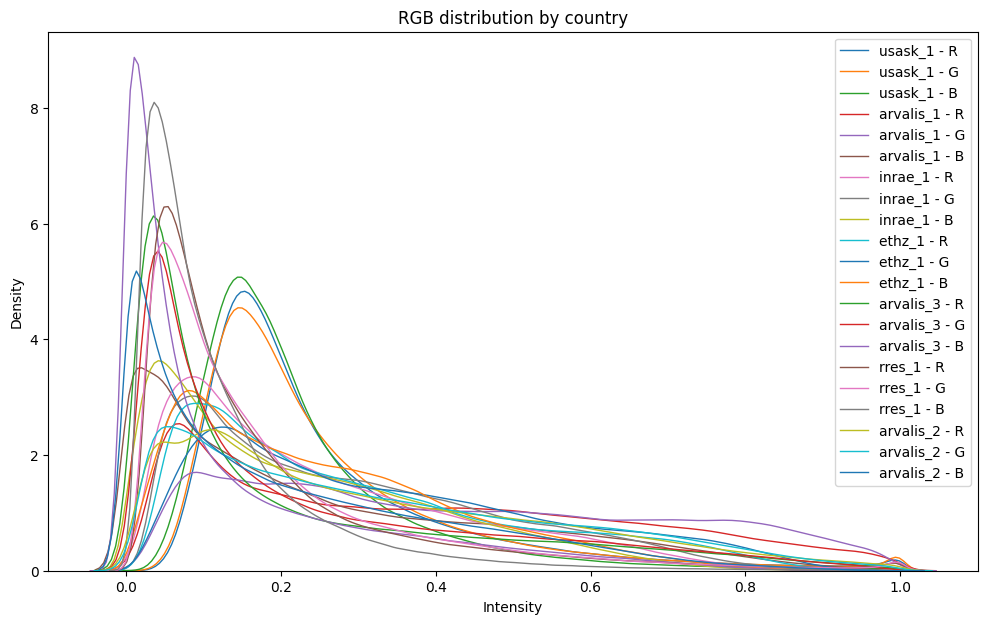

In [28]:
plt.figure(figsize=(12,7))

for country in countries:
    imgs = load_images_by_country(df, country, max_images=30)
    colors = imgs.reshape(-1,3)
    
    sns.kdeplot(colors[:,0], label=f"{country} - R", linewidth=1)
    sns.kdeplot(colors[:,1], label=f"{country} - G", linewidth=1)
    sns.kdeplot(colors[:,2], label=f"{country} - B", linewidth=1)

plt.title("RGB distribution by country")
plt.xlabel("Intensity")
plt.ylabel("Density")

plt.legend()
plt.show()


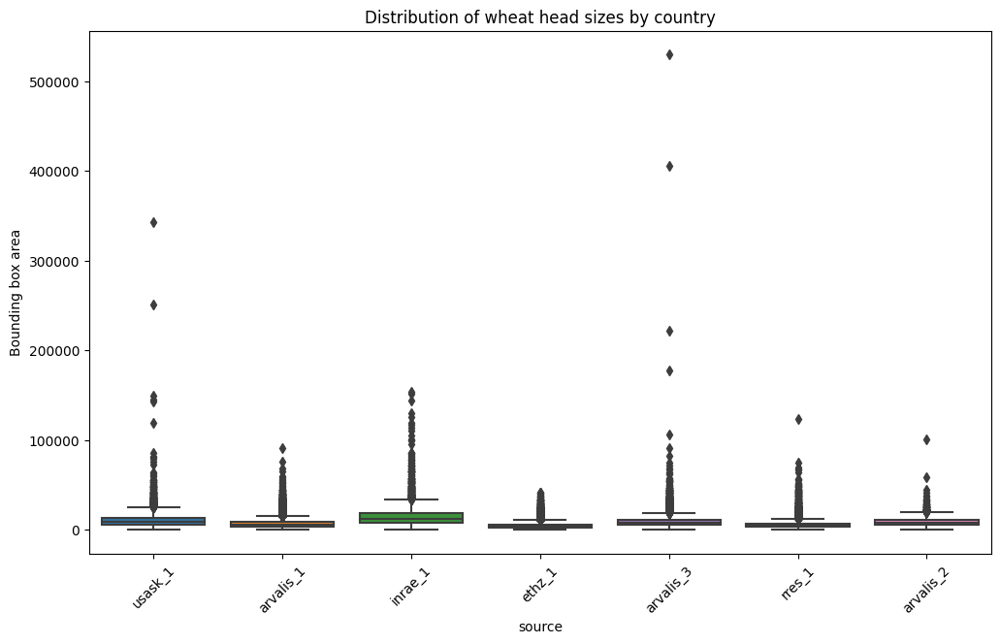

In [29]:
df['area'] = df['w'] * df['h']

plt.figure(figsize=(12,7))
sns.boxplot(data=df, x="source", y="area")
plt.xticks(rotation=45)
plt.title("Distribution of wheat head sizes by country")
plt.ylabel("Bounding box area")

plt.show()
